In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from scipy import ndimage



Threshold

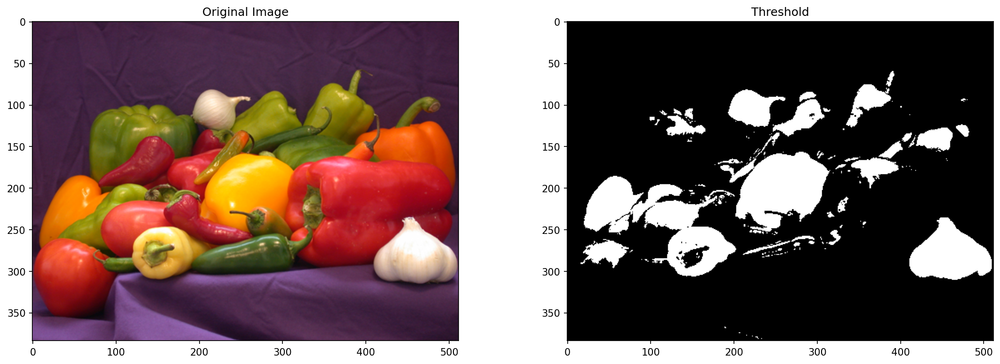

In [2]:

img = cv.imread('peppers.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
imgToProcess = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
ret,thresh1 = cv.threshold(imgToProcess,255*0.5,255,cv.THRESH_BINARY)
# ret,thresh2 = cv.threshold(img,255*0.5,255,cv.THRESH_BINARY_INV)
# ret,thresh3 = cv.threshold(img,127,255,cv.THRESH_TRUNC)
# ret,thresh4 = cv.threshold(img,127,255,cv.THRESH_TOZERO)
# ret,thresh5 = cv.threshold(img,127,255,cv.THRESH_TOZERO_INV)
# ret,thresh6 = cv.threshold(img,127,255,cv.THRESH_MASK)
# ret,thresh7 = cv.threshold(img,127,255,cv.THRESH_OTSU)
# ret, thresh8 = cv.threshold(img,127,255,cv.THRESH_TRIANGLE)
titles = ['Original Image','Threshold']
images = [img, thresh1]
figure(figsize=(18, 13), dpi=150)
for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i], 'gray', vmin=0, vmax=255)
    plt.title(titles[i])
    # plt.xticks([]),plt.yticks([])
plt.show()

Grayscale

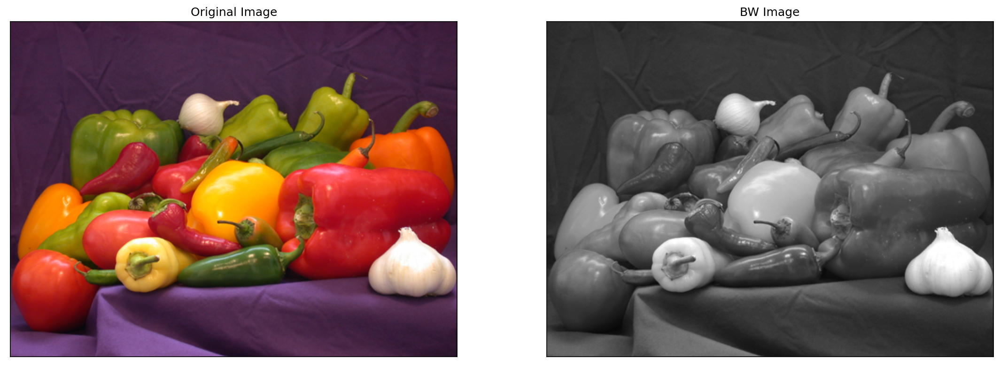

In [3]:
img = cv.imread('peppers.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
gray_image = cv.cvtColor(img, cv.COLOR_RGB2GRAY)


titles = ['Original Image', 'BW Image', 'BW Inv Image']
images = [img, gray_image]

figure(figsize=(18, 13), dpi=150)

for i in range(2):
    plt.subplot(1, 2, i+1),plt.imshow(images[i], 'gray', vmin=0, vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

Roberts Edge Detection

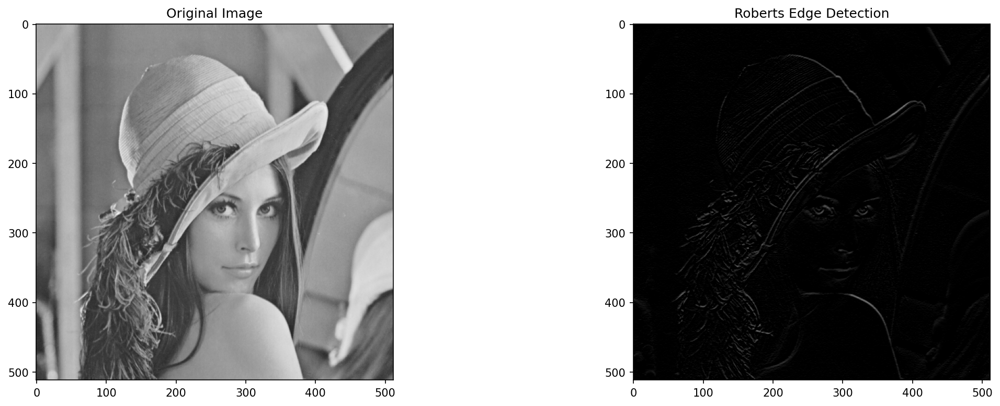

In [187]:
roberts_cross_v = np.array( [[0, 0, 0],
                             [0, 1, 0],
                             [0, 0, -1]] )
  
roberts_cross_h = np.array( [[0, 0, 0],
                             [0, 0, 1],
                             [0, -1, 0]] )
  
img = cv.imread("Lenna.png", 0)

image = np.asarray(img, dtype='int32')
vertical = ndimage.convolve(image, roberts_cross_v)
horizontal = ndimage.convolve(image, roberts_cross_h)
output_image = np.sqrt(np.square(horizontal) + np.square(vertical))
output_image = np.asarray(np.clip(output_image, 0, 255), dtype='uint8')
figure(figsize=(18, 13), dpi=150)
  
img = cv.cvtColor(img, cv.COLOR_GRAY2BGR)
image = vertical + horizontal
images = [img, image]
titles = ['Original Image', 'Roberts Edge Detection']
for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])

plt.show()

PASSA BAIXA MEDIANA

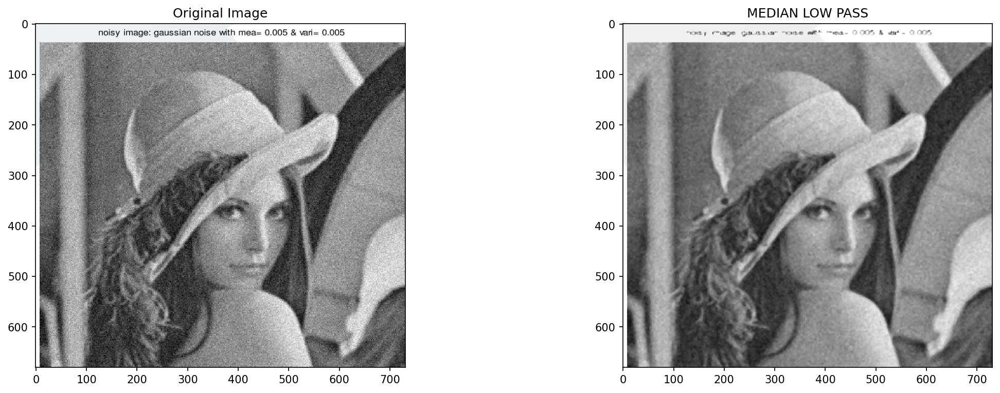

In [89]:
img = cv.imread('noise.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_as_array = np.array(img, dtype=float) / 255
# # print(img)
# h = np.array([
#     [1, 1, 1], 
#     [1, 1, 1], 
#     [1, 1, 1]])

grayImg = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
# h = h * (1/9)
# filter2d = cv.filter2D(src=img, ddepth=-1, kernel=h)

filter2d = cv.medianBlur(grayImg, 5)
# compare = np.concatenate((grayImg, filter2d), axis=1)

images = [img, filter2d]
titles = ['Original Image', 'MEDIAN LOW PASS']

figure(figsize=(18, 13), dpi=150)

for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])
plt.show()


PASSA BAIXA BASICO

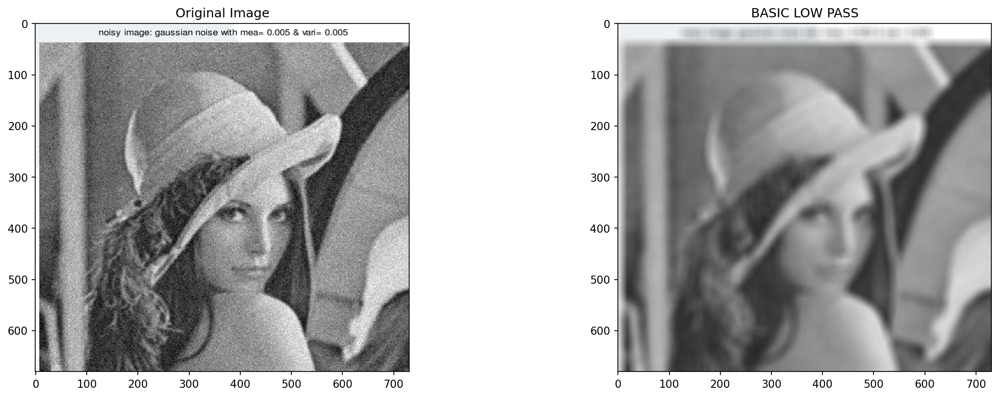

In [60]:
img = cv.imread('noise.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

x = 20

kernel = np.ones((x,x),np.float32)/(x*x)
img2 = cv.filter2D(img,ddepth=-1,kernel=kernel)

images = [img, img2]
titles = ["Original Image", "BASIC LOW PASS"]

passaAlta = img - img2

figure(figsize=(18, 13), dpi=150)

for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i])
    plt.title(titles[i])

plt.show()

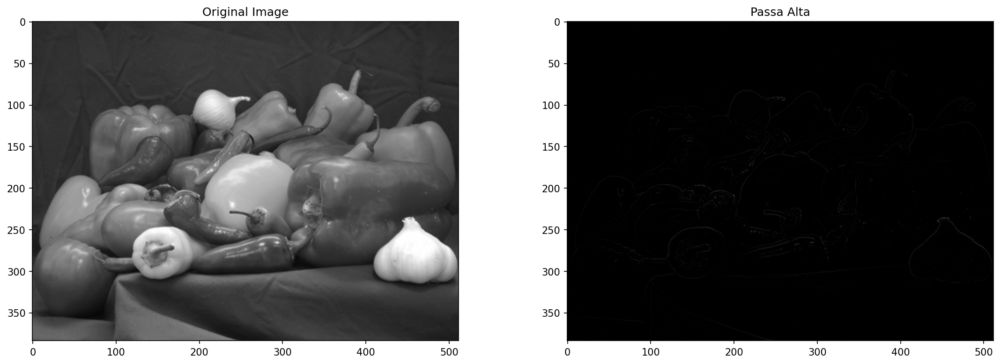

In [122]:
img = cv.imread('peppers.png',0)
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

w = 8

h = np.array([
    [-1, -1, -1],
    [-1, w, -1],
    [-1, -1, -1],
    ]) 

h = h * 1/9

passaAlta = cv.filter2D(src=img, ddepth=-1, kernel=h)


images = [img, passaAlta]
titles = ['Original Image', 'Passa Alta']


figure(figsize=(18, 13), dpi=150)

for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i])
    plt.title(titles[i])
plt.show()


In [90]:
img = cv.imread('peppers.png')
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#TODO

# A = 100
# w = 9*A - 1

# h = np.array([
#     [-1, -1, -1],
#     [-1, w, -1],
#     [-1, -1, -1],
#     ])
passaAlta = cv.cvtColor(passaAlta, cv.COLOR_BGR2GRAY)

ar = (2-1) * img + passaAlta
# ar = cv.cvtColor(ar, cv.COLOR_RGB2GRAY)
# h = h * 1/w
# ar = cv.filter2D(src=img, ddepth=-1, kernel=h)
# A = 2
# ar = (A-1) * img + passaAlta

images = [img, ar]
titles = ['Original Image', 'Passa Alta Alto Reforco']

figure(figsize=(18, 13), dpi=150)


for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i], 'gray', vmin=0, vmax=255)
    plt.title(titles[i])
plt.show()

error: OpenCV(4.6.0) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::impl::`anonymous namespace'::Set<3,4,-1>,struct cv::impl::A0xf2302844::Set<1,-1,-1>,struct cv::impl::A0xf2302844::Set<0,2,5>,2>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


In [138]:
def highpass(img, sigma, parameter):
    return img - cv.GaussianBlur(img, (3, 3), sigma) + int(parameter*255)


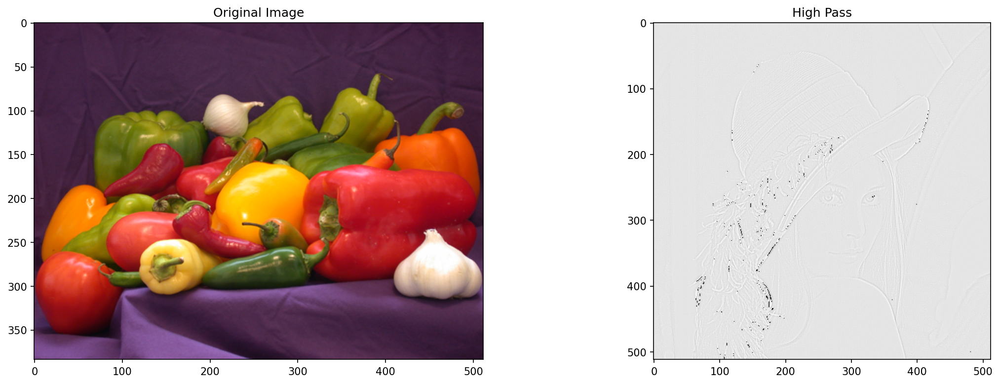

In [154]:
img = cv.imread('lenna.png',0)
imge = cv.cvtColor(img, cv.COLOR_BGR2RGB)
#TODO

img_result = highpass(imge, 20, 0.9)
# img_result = img - img2

figure(figsize=(18, 13), dpi=150)

img = cv.imread('peppers.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
images = [img, img_result]
titles = ['Original Image', 'High Pass']

for i in range(2):
    plt.subplot(2, 2, i+1),plt.imshow(images[i])
    plt.title(titles[i])
plt.show()

In [135]:
img = cv.imread('lenna.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

lowpass = ndimage.gaussian_filter(img, 3)
result = img - lowpass

plt.gray
plt.subplot(1,1,1),plt.imshow(result)
plt.show()

NameError: name 'Image' is not defined

HISTOGRAM

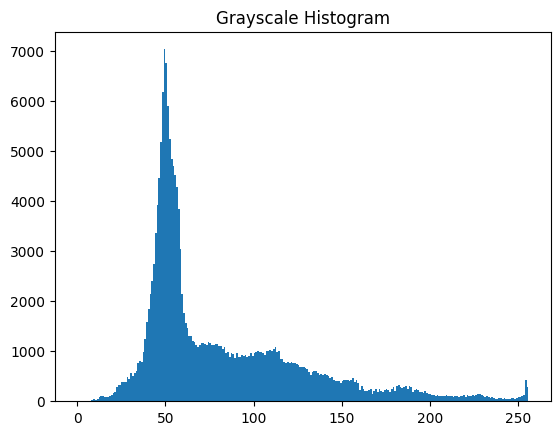

In [161]:
img = cv.imread('peppers.png', cv.IMREAD_GRAYSCALE)

dst = cv.calcHist(img, [0], None, [256], [0,256])

plt.hist(img.ravel(),256,[0,256])
plt.title('Grayscale Histogram')
plt.show()


SOBEL

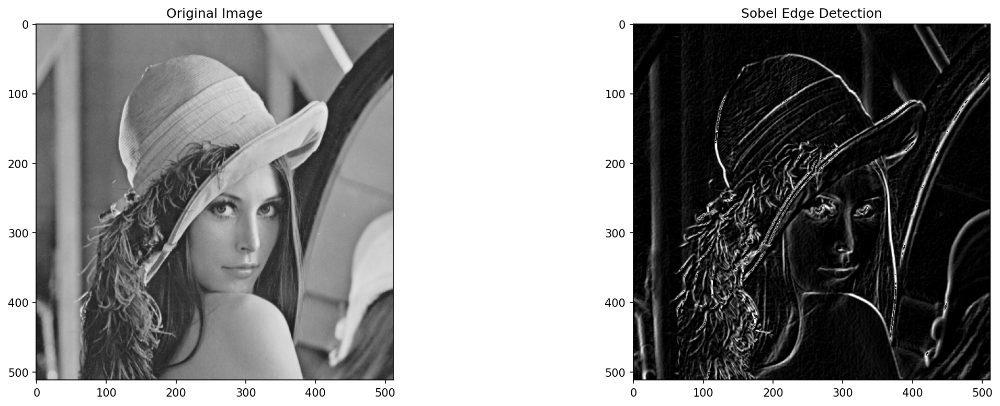

In [206]:

  
img = cv.imread("Lenna.png")
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gaussian = cv.GaussianBlur(gray,(3,3),0)
img_sobelx = cv.Sobel(img_gaussian,cv.CV_8U,1,0,ksize=3)
img_sobely = cv.Sobel(img_gaussian,cv.CV_8U,0,1,ksize=3)
img_sobel = img_sobelx + img_sobely
figure(figsize=(18, 13), dpi=150)

images = [gray, img_sobel]
titles = ['Original Image', 'Sobel Edge Detection']
for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])

plt.show()

PREWITT

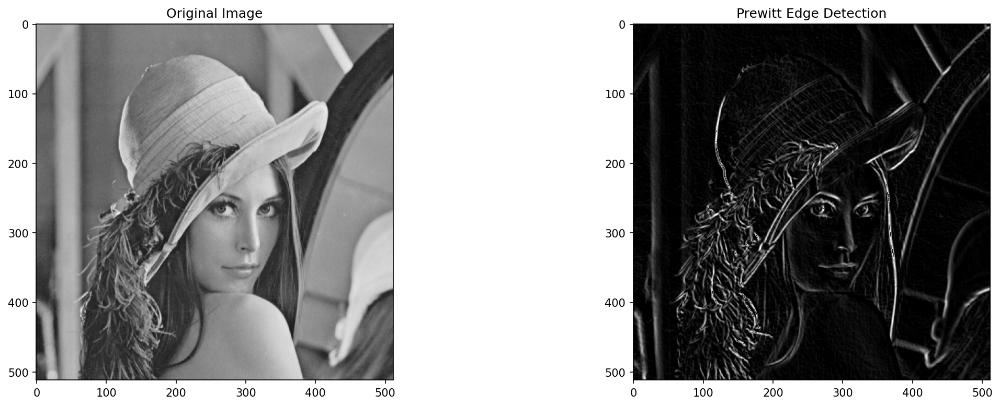

In [209]:
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

img = cv.imread('Lenna.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gaussian = cv.GaussianBlur(gray,(3,3),0)

img_prewittx = cv.filter2D(img_gaussian, -1, kernelx)
img_prewitty = cv.filter2D(img_gaussian, -1, kernely)
img_prewitt = img_prewittx + img_prewitty
figure(figsize=(18, 13), dpi=150)
  
images = [gray, img_prewitt]
titles = ['Original Image', 'Prewitt Edge Detection']
for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])

plt.show()

Canny


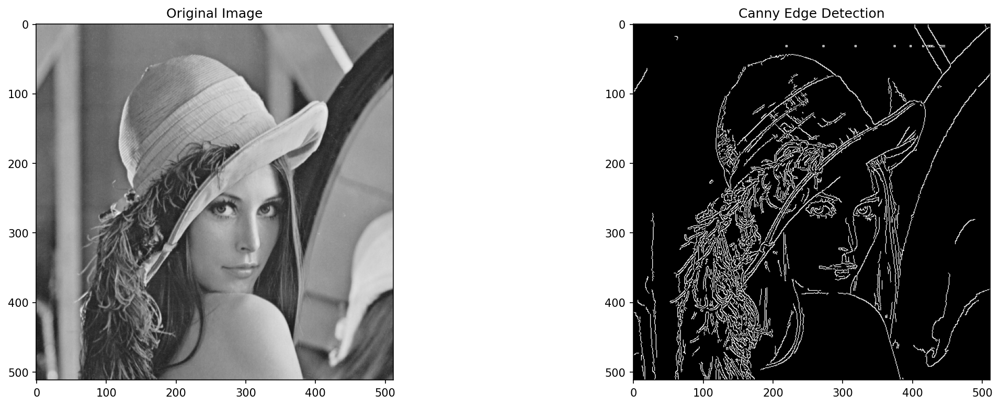

In [194]:
img = cv.imread('Lenna.png')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img_gaussian = cv.GaussianBlur(gray,(3,3),0)

img_canny = cv.Canny(img, 100, 200)

figure(figsize=(18, 13), dpi=150)

images = [gray, img_canny]
titles = ['Original Image', 'Canny Edge Detection']
for i in range(2):
    plt.subplot(2,2,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])

plt.show()

WATERSHED

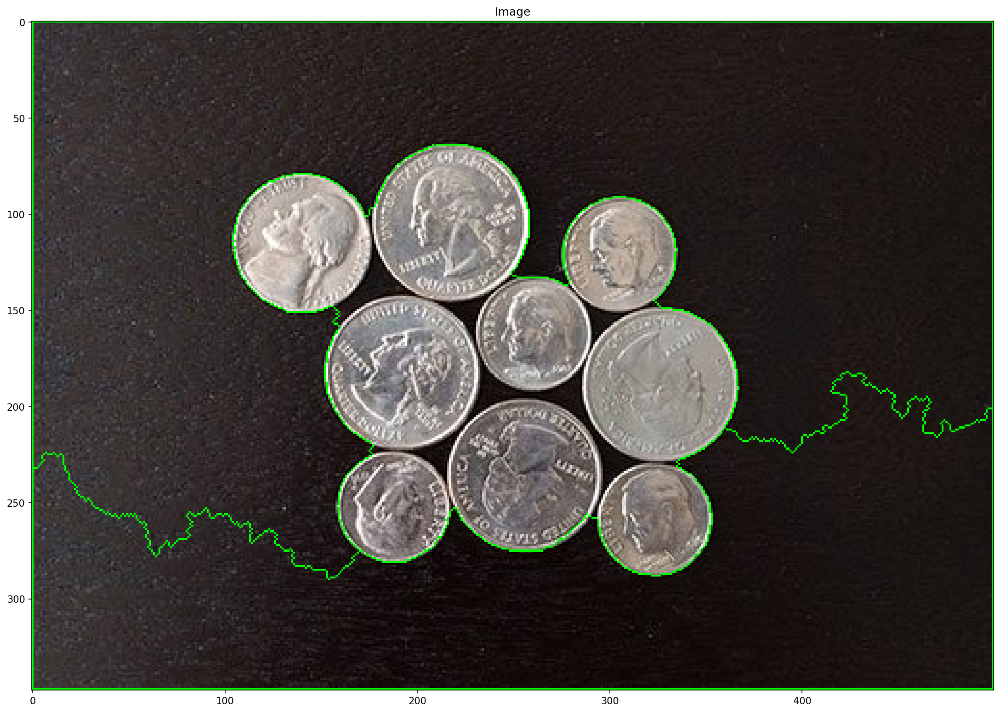

In [13]:
img = cv.imread('coins.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)
figure(figsize=(18, 13), dpi=150)

# noise removal
kernel = np.ones((3,3),np.uint8)
opening = cv.morphologyEx(thresh,cv.MORPH_OPEN,kernel, iterations = 2)

# sure background area
sure_bg = cv.dilate(opening,kernel,iterations=3)

# Finding sure foreground area
dist_transform = cv.distanceTransform(opening,cv.DIST_L2,5)
ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv.subtract(sure_bg,sure_fg)

# Marker labelling
ret, markers = cv.connectedComponents(sure_fg)

# Add one to all labels so that sure background is not 0, but 1
markers = markers+1

# Now, mark the region of unknown with zero
markers[unknown==255] = 0

markers = cv.watershed(img,markers)
img[markers == -1] = [0,255,0]

images = [img]
titles = ['Image']
for i in range(1):
    plt.subplot(1,1,i+1),plt.imshow(images[i],  'gray', vmin=0, vmax=255)
    plt.title(titles[i])

plt.show()